# Final Project: KSMeans Clustering

## Import Data

In [1]:
# Import Library
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler      # Scaling Data with Min/Max
from sklearn.preprocessing import StandardScaler    # Scaling Data with Standard Scaler
from sklearn.preprocessing import normalize         # Normalize Data
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
import seaborn as sns
pd.options.mode.chained_assignment = None           # Get rid of 'SettingWithCopyWarning'
import plotly.express as px                         # 3D Plot

In [2]:
# Import Data
raw_data = pd.read_csv('insurance_data.csv')

In [3]:
# Check the first five patient
raw_data.head()

,PatientID,Age,Gender,BMI,Bloodpressure,Diabetic,Children,Smoker,Region,Claim
0,1,39,male,23.2,91,Yes,0,No,southeast,1121.87
1,2,24,male,30.1,87,No,0,No,southeast,1131.51
2,3,18,male,33.3,82,Yes,0,No,southeast,1135.94
3,4,21,male,33.7,80,No,0,No,northwest,1136.40
4,5,32,male,34.1,100,No,0,No,northwest,1137.01


In [4]:
# Drop NA
raw_data.dropna(inplace = True)

In [5]:
# Check Overall Data
raw_data.describe()

,PatientID,Age,BMI,Bloodpressure,Children,Claim
count,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000
mean,670.500000,38.051493,30.668955,94.157463,1.093284,13252.745642
std,386.968991,11.107979,6.106735,11.434712,1.205334,12109.609288
min,1.000000,18.000000,16.000000,80.000000,0.000000,1121.870000
25%,335.750000,29.000000,26.275000,86.000000,0.000000,4719.685000
50%,670.500000,38.000000,30.400000,92.000000,1.000000,9369.615000
75%,1005.250000,47.000000,34.700000,99.000000,2.000000,16604.305000
max,1340.000000,60.000000,53.100000,140.000000,5.000000,63770.430000


* There are 1340 patients in total.

In [6]:
raw_data.columns

Index(['PatientID', 'Age', 'Gender', 'BMI', 'Bloodpressure', 'Diabetic',
       'Children', 'Smoker', 'Region', 'Claim'],
      dtype='object')

In [7]:
# Main Theme
sns.blend_palette(['#138808','#ff9933','#434343'])

[(0.07450980392156863, 0.5333333333333333, 0.03137254901960784),
 (0.44470588235294123, 0.5599999999999999, 0.09882352941176471),
 (0.8149019607843138, 0.5866666666666667, 0.16627450980392158),
 (0.8525490196078431, 0.5325490196078431, 0.21254901960784314),
 (0.5576470588235294, 0.3976470588235294, 0.23764705882352943),
 (0.2627450980392157, 0.2627450980392157, 0.2627450980392157)]

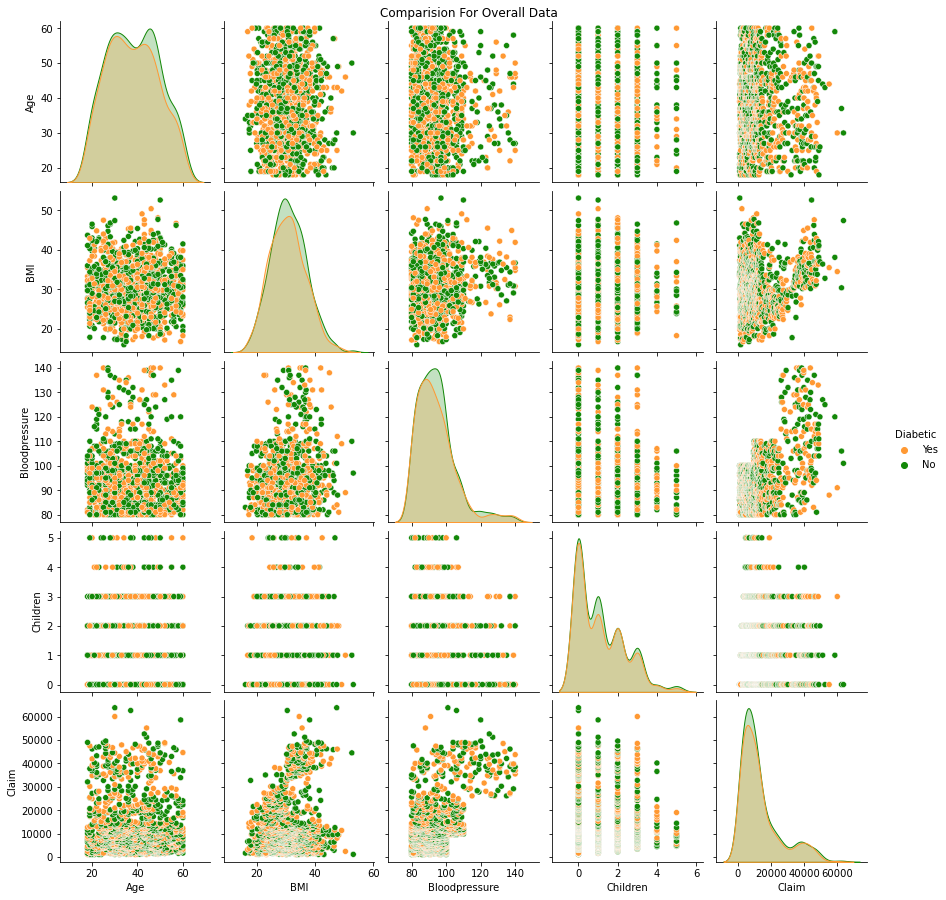

In [8]:
# Create dataframe without PatientID
no_patient = raw_data[['Age', 'Gender', 'BMI', 'Bloodpressure', 'Diabetic',
                       'Children', 'Smoker', 'Region', 'Claim']]

# Create Pair Plot
sns.pairplot(data = no_patient, 
             hue = 'Diabetic',
            palette = sns.blend_palette(['#ff9933','#138808'],2)).fig.suptitle("Comparision For Overall Data", y = 1);

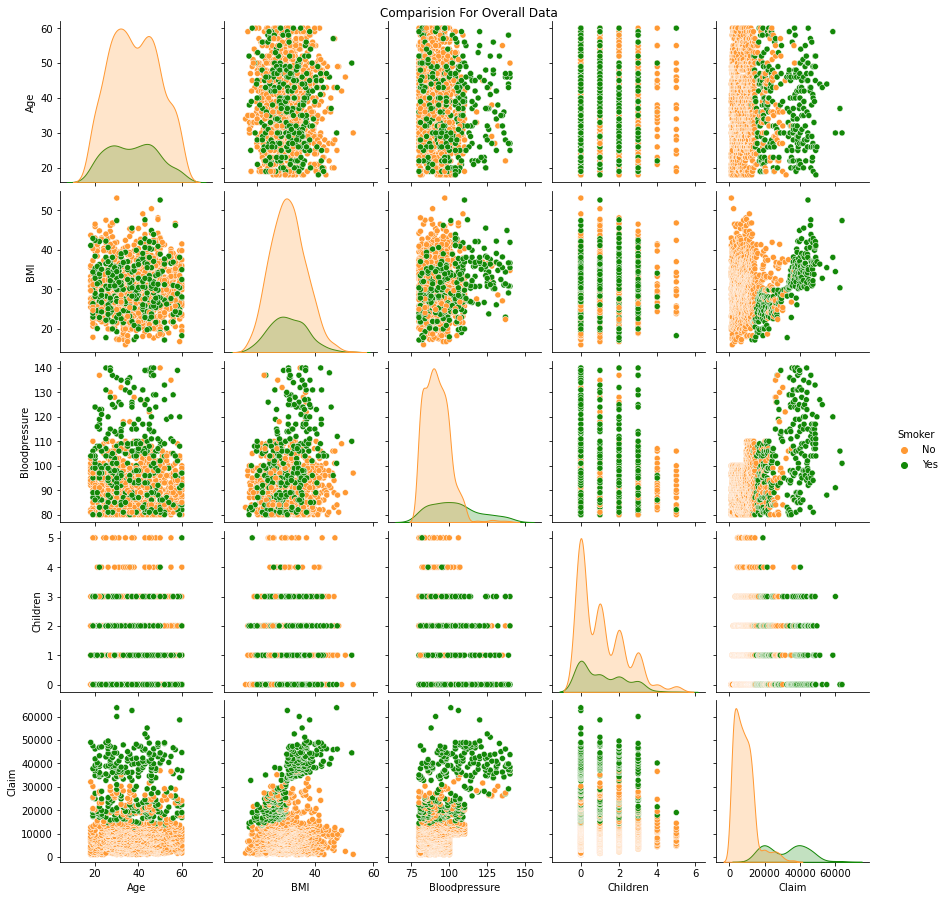

In [9]:
# Create dataframe without PatientID
no_patient = raw_data[['Age', 'Gender', 'BMI', 'Bloodpressure', 'Diabetic',
                       'Children', 'Smoker', 'Region', 'Claim']]

# Create Pair Plot
sns.pairplot(data = no_patient, 
             hue = 'Smoker',
            palette = sns.blend_palette(['#ff9933','#138808',],2)).fig.suptitle("Comparision For Overall Data", y = 1);

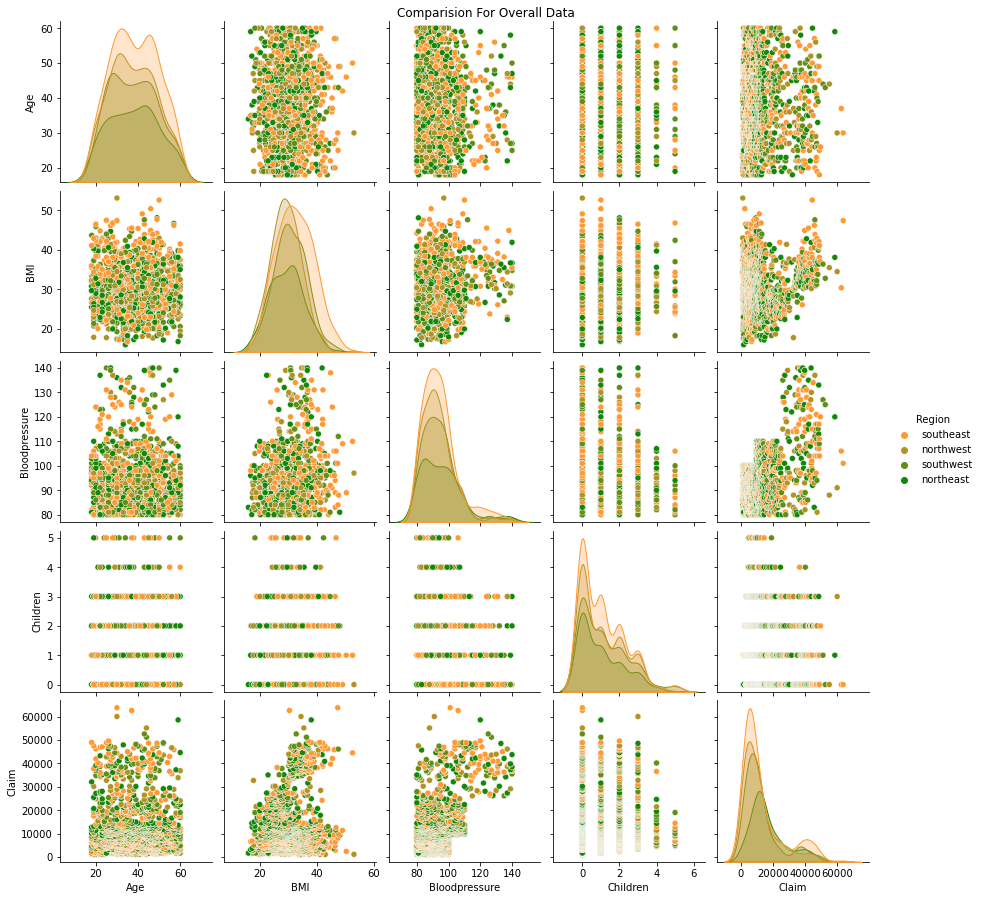

In [10]:
# Create dataframe without PatientID
no_patient = raw_data[['Age', 'Gender', 'BMI', 'Bloodpressure', 'Diabetic',
                       'Children', 'Smoker', 'Region', 'Claim']]

# Create Pair Plot
sns.pairplot(data = no_patient, 
             hue = 'Region',
            palette = sns.blend_palette(['#ff9933','#138808'],4)).fig.suptitle("Comparision For Overall Data", y = 1);

In [12]:
# On 'Smoker' change from 'Yes'/'No' to 0-1
sex_data = raw_data
sex_data['Smoker'].replace(['No','Yes'],[0,1], inplace = True)
sex_data.head()

,PatientID,Age,Gender,BMI,Bloodpressure,Diabetic,Children,Smoker,Region,Claim
0,1,39,male,23.2,91,Yes,0,0,southeast,1121.87
1,2,24,male,30.1,87,No,0,0,southeast,1131.51
2,3,18,male,33.3,82,Yes,0,0,southeast,1135.94
3,4,21,male,33.7,80,No,0,0,northwest,1136.40
4,5,32,male,34.1,100,No,0,0,northwest,1137.01


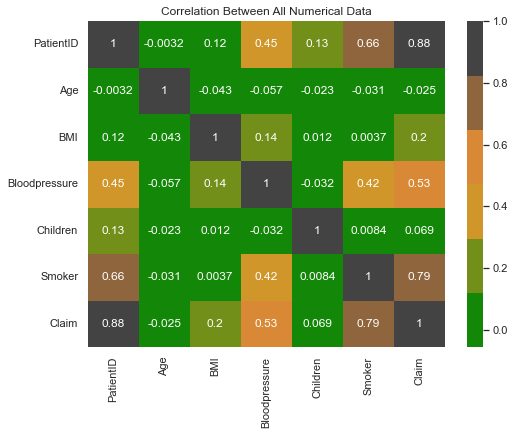

In [46]:
# Create correlation map
sns.set(rc={'figure.figsize':(8,6)})
sns.heatmap(raw_data.corr(), annot=True, cmap = sns.blend_palette(['#138808','#ff9933','#434343'])).set_title('Correlation Between All Numerical Data');
# 'annot' = showing the correlation numbers
# camp could be manything: 'YlGnBu', 'coolwarm', 'icefire', 'Blues', 'BuPu', 'Greens', etc. 

> Based on the corerlation above, we decided the change 'Smoker' from Yes/No to numerical value (0-1) for the clustering because it appears that smoking status is highly correlated with the insurance claim unlike diabetic status and gender of the patient.

---

## KMeans Clustering

### KMeans Clustering (Not Normalizing Data)

In [13]:
# Drop the data that we do not need
insurance1 = sex_data.drop(labels = ['PatientID', 'Gender', 'Diabetic', 'Region'],
                          axis = 1,
                          inplace = False)
insurance1.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim
0,39,23.2,91,0,0,1121.87
1,24,30.1,87,0,0,1131.51
2,18,33.3,82,0,0,1135.94
3,21,33.7,80,0,0,1136.40
4,32,34.1,100,0,0,1137.01


In [14]:
# Create Cluster of 3
km = KMeans(n_clusters = 3)

# Predcited the cluster of each pateint based on 'Age', 'BMI', 'Bloodpressure', 'Children', and 'Claim'
y_predicted = km.fit_predict(insurance1[['Age', 'BMI', 'Bloodpressure', 'Children', 'Smoker','Claim']])
y_predicted

# Add cluster to the table
insurance1['Cluster'] = y_predicted
insurance1.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Cluster
0,39,23.2,91,0,0,1121.87,0
1,24,30.1,87,0,0,1131.51,0
2,18,33.3,82,0,0,1135.94,0
3,21,33.7,80,0,0,1136.40,0
4,32,34.1,100,0,0,1137.01,0


In [15]:
### Run PCA on the data to reduce the dimensions from 5 to 2 dimensions.

pca_num = 3 # Need to dimension: PCA 1 and PCA 2

# Create PCA 1 and 2 Data
reduced_insurance = PCA(n_components = pca_num).fit_transform(insurance1)
results_insurance = pd.DataFrame(reduced_insurance, columns = ['PCA1','PCA2','PCA3']) # New dataframe for PCA1 and PCA2

# Add PCA 1 and PCA 2 to the Insurance data
insurance1['PCA1'] = results_insurance['PCA1']
insurance1['PCA2'] = results_insurance['PCA2']
insurance1['PCA3'] = results_insurance['PCA3']

In [16]:
# Add +1 to the cluster value to range from 1-3 instead of 0-2
insurance1['Cluster'] = insurance1['Cluster'] + 1
insurance1.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Cluster,PCA1,PCA2,PCA3
0,39,23.2,91,0,0,1121.87,1,-12130.876422,0.334857,2.770754
1,24,30.1,87,0,0,1131.51,1,-12121.237395,-13.909164,-3.653164
2,18,33.3,82,0,0,1135.94,1,-12116.809446,-19.001606,-9.545616
3,21,33.7,80,0,0,1136.40,1,-12116.350479,-15.702519,-10.944047
4,32,34.1,100,0,0,1137.01,1,-12115.730661,-8.554718,10.734516


In [17]:
# Save data back to PC
# insurance1.to_csv('insurance_cluster.csv', index = False)

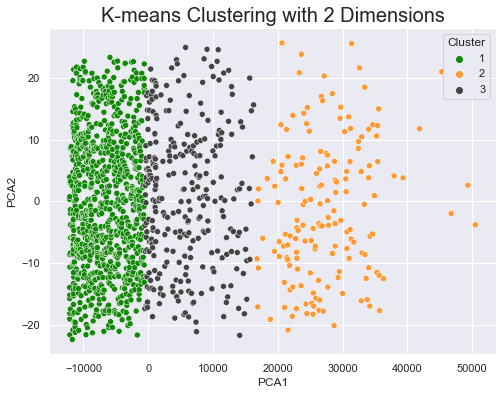

In [18]:
# Make a plot based on each cluster
sns.scatterplot(x = 'PCA1', y = 'PCA2', 
                hue = insurance1['Cluster'], 
                palette = sns.blend_palette(['#138808','#ff9933','#434343'],3), 
                data = insurance1)
plt.title('K-means Clustering with 2 Dimensions', fontsize = 20)
plt.show()

Text(0.5, 1.0, 'Correlation Between All Numerical Data')

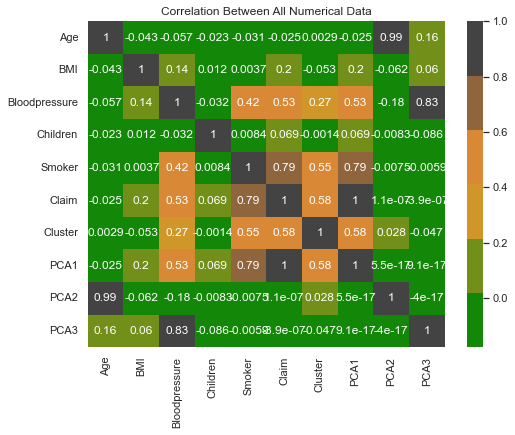

In [19]:
sns.heatmap(insurance1.corr(), annot=True, 
            cmap = sns.blend_palette(['#138808','#ff9933','#434343'])).set_title('Correlation Between All Numerical Data')

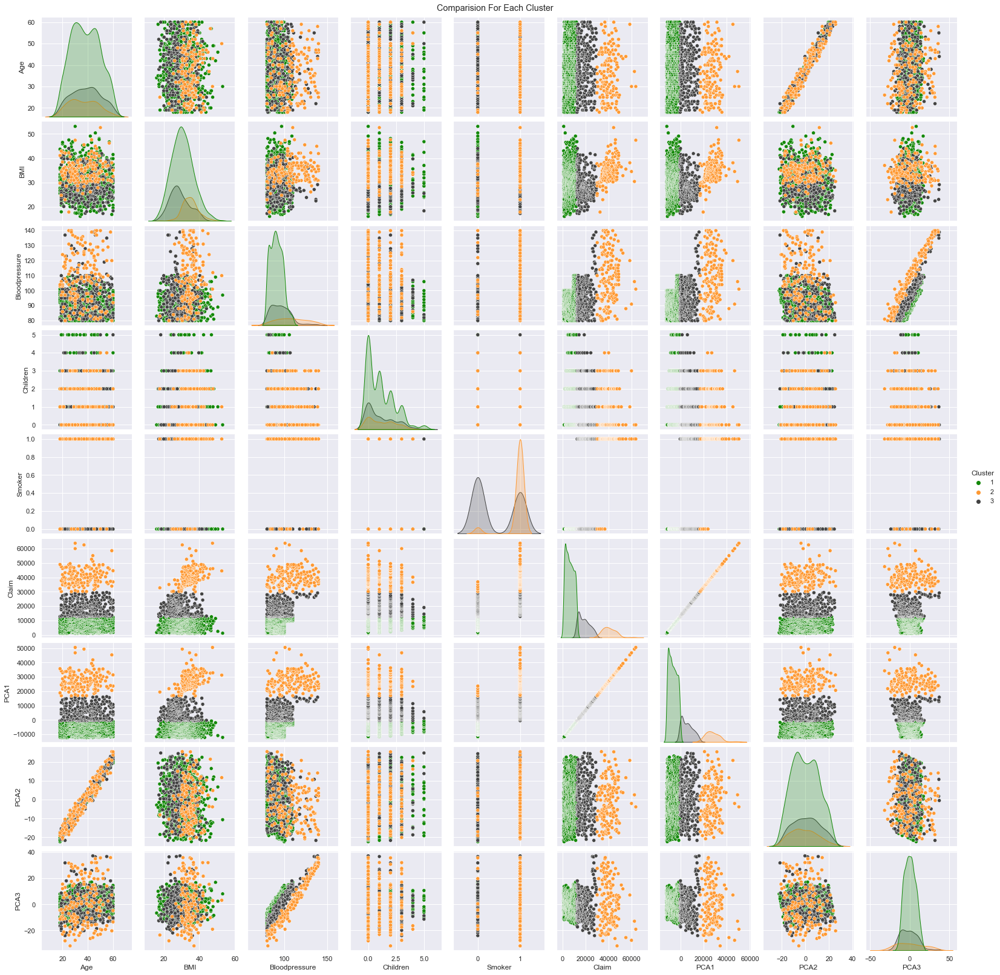

In [20]:
sns.pairplot(data = insurance1, hue = 'Cluster',
            palette = sns.blend_palette(['#138808','#ff9933','#434343'],3)).fig.suptitle("Comparision For Each Cluster", y = 1);

In [21]:
fig1 = px.scatter_3d(insurance1, x = 'PCA1', y = 'PCA2',z = 'PCA3', 
                     color = 'Cluster', 
                     size = 'Claim',
                     opacity = 0.7,
                     color_continuous_scale = ['#138808','#ff9933','#434343'],
                     title = '6 Features Representation')
fig1.show()

In [22]:
# Save 3D Graph
# fig1.write_html('3D_Graph.html')

In [23]:
# Average 'Claim' for Each Cluster
cluster_mean1 = insurance1[['Claim','Cluster', 'Age','BMI','Bloodpressure',
                               'Children','Smoker','PCA1','PCA2','PCA3']].groupby('Cluster').mean()
cluster_mean1

,Claim,Age,BMI,Bloodpressure,Children,Smoker,PCA1,PCA2,PCA3
Cluster,,,,,,,,,
1,6418.905169,38.179775,30.487191,90.906742,1.087640,0.000000,-6833.841249,-0.080121,0.188983
2,40761.308889,36.419753,34.852469,109.098765,1.166667,0.938272,27508.567598,-1.233277,0.996015
3,18897.644167,38.572917,28.877431,95.798611,1.069444,0.423611,5644.898474,0.941314,-1.144269


In [24]:
# Find the total number of each cluster
insurance1.groupby('Cluster').count()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,PCA1,PCA2,PCA3
Cluster,,,,,,,,,
1,890,890,890,890,890,890,890,890,890
2,162,162,162,162,162,162,162,162,162
3,288,288,288,288,288,288,288,288,288


---

### KMeans Clustering (Normalize Data with Min/Max)

#### Normalizing Data ( 0 - 1)

In [25]:
# Create Data frame and drop the data that we do not need
insurance2 = sex_data.drop(labels = ['PatientID', 'Gender', 'Diabetic', 'Region'],
                          axis = 1,
                          inplace = False)
insurance2.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim
0,39,23.2,91,0,0,1121.87
1,24,30.1,87,0,0,1131.51
2,18,33.3,82,0,0,1135.94
3,21,33.7,80,0,0,1136.40
4,32,34.1,100,0,0,1137.01


In [26]:
insurance2_normalize = pd.DataFrame( normalize(insurance2), columns = insurance2.columns) 
# x = (x - min) / (max - min)
insurance2_normalize.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim
0,0.034621,0.020595,0.080783,0.0,0.0,0.995917
1,0.021136,0.026508,0.076618,0.0,0.0,0.996484
2,0.015796,0.029223,0.071960,0.0,0.0,0.996854
3,0.018423,0.029564,0.070181,0.0,0.0,0.996926
4,0.028012,0.029851,0.087538,0.0,0.0,0.995320


In [27]:
# Create Cluster of 3
km = KMeans(n_clusters = 3)

# Predcited the cluster of each pateint based on 'Age', 'BMI', 'Bloodpressure', 'Children', and 'Claim'
y_predicted = km.fit_predict(insurance2_normalize[['Age', 'BMI', 'Bloodpressure', 'Children', 'Smoker','Claim']])
y_predicted

# Add cluster to the table
insurance2_normalize['Cluster'] = y_predicted
insurance2_normalize.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Cluster
0,0.034621,0.020595,0.080783,0.0,0.0,0.995917,2
1,0.021136,0.026508,0.076618,0.0,0.0,0.996484,2
2,0.015796,0.029223,0.071960,0.0,0.0,0.996854,2
3,0.018423,0.029564,0.070181,0.0,0.0,0.996926,2
4,0.028012,0.029851,0.087538,0.0,0.0,0.995320,2


In [28]:
### Run PCA on the data to reduce the dimensions from 5 to 2 dimensions.

pca_num = 3 # Need to dimension: PCA 1 and PCA 2

# Create PCA 1 and 2 Data
reduced_insurance = PCA(n_components = pca_num).fit_transform(insurance2_normalize)
results_insurance = pd.DataFrame(reduced_insurance, columns = ['PCA1','PCA2','PCA3']) # New dataframe for PCA1 and PCA2

# Add PCA 1 and PCA 2 to the Insurance data
insurance2_normalize['PCA1'] = results_insurance['PCA1']
insurance2_normalize['PCA2'] = results_insurance['PCA2']
insurance2_normalize['PCA3'] = results_insurance['PCA3']

In [29]:
# Add +1 to the cluster value to range from 1-3 instead of 0-2
insurance2_normalize['Cluster'] = insurance2_normalize['Cluster'] + 1
insurance2_normalize.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Cluster,PCA1,PCA2,PCA3
0,0.034621,0.020595,0.080783,0.0,0.0,0.995917,3,1.608739,0.033892,-0.003928
1,0.021136,0.026508,0.076618,0.0,0.0,0.996484,3,1.608575,0.027828,0.008635
2,0.015796,0.029223,0.071960,0.0,0.0,0.996854,3,1.608450,0.022872,0.012832
3,0.018423,0.029564,0.070181,0.0,0.0,0.996926,3,1.608438,0.022238,0.009906
4,0.028012,0.029851,0.087538,0.0,0.0,0.995320,3,1.608890,0.040860,0.005722


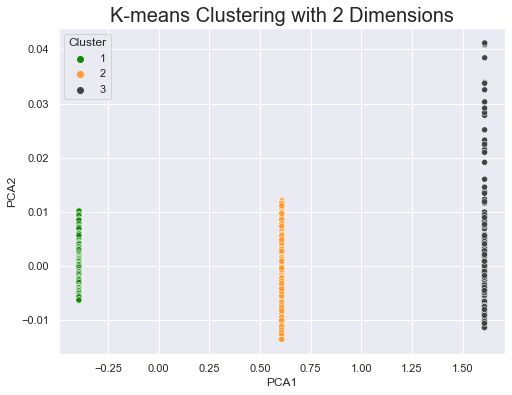

In [30]:
# Make a plot based on each cluster
sns.scatterplot(x = 'PCA1', y = 'PCA2', hue = insurance2_normalize['Cluster'], 
                palette = sns.blend_palette(['#138808','#ff9933','#434343'],3), 
                data = insurance2_normalize)
plt.title('K-means Clustering with 2 Dimensions', fontsize = 20)
plt.show()

Text(0.5, 1.0, 'Correlation Between All Numerical Data')

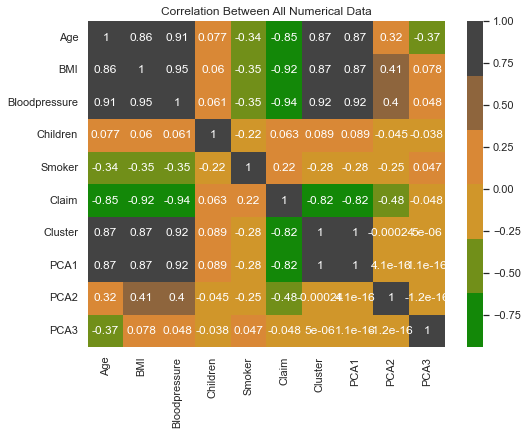

In [31]:
sns.heatmap(insurance2_normalize.corr(), annot=True, 
            cmap = sns.blend_palette(['#138808','#ff9933','#434343'])).set_title('Correlation Between All Numerical Data')

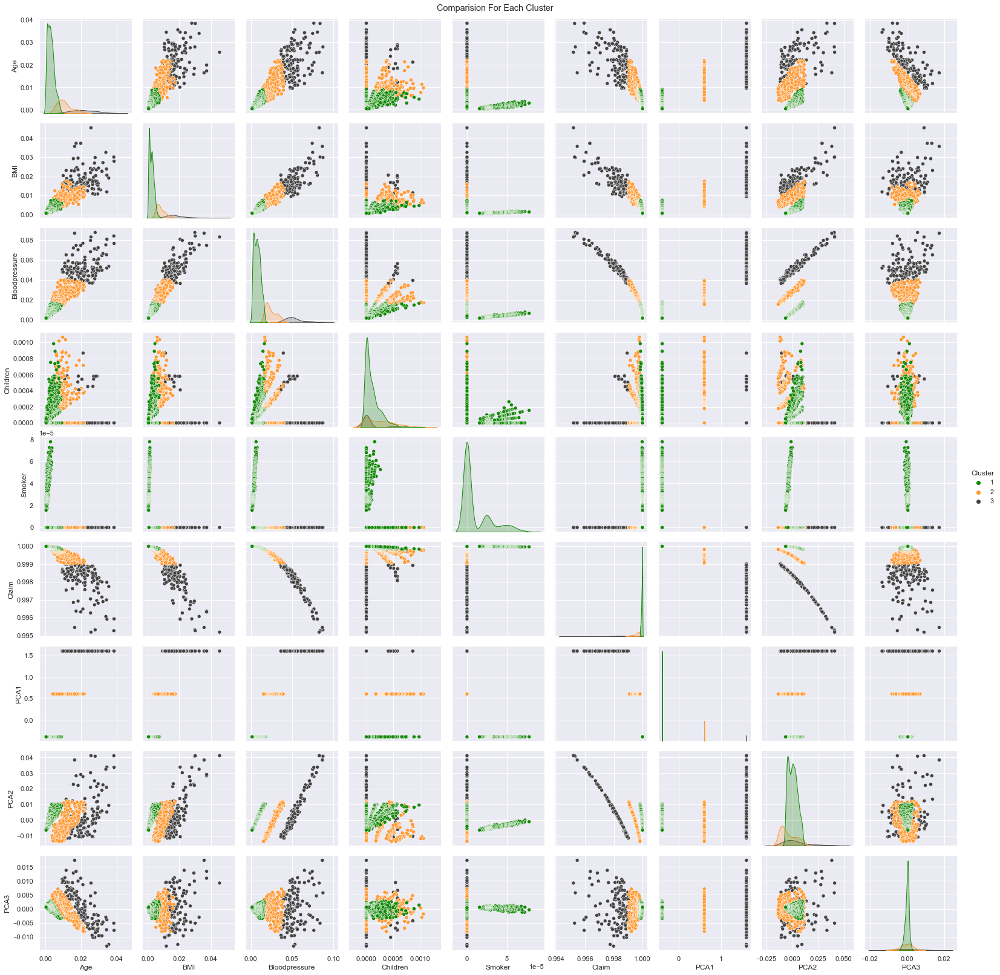

In [32]:
sns.pairplot(data = insurance2_normalize, hue = 'Cluster',
            palette = sns.blend_palette(['#138808','#ff9933','#434343'],3)).fig.suptitle("Comparision For Each Cluster", y = 1);

In [33]:
fig2 = px.scatter_3d(insurance2_normalize, x = 'PCA1', y = 'PCA2',z = 'PCA3', 
                     color = 'Cluster', 
                     size = 'Claim',
                     opacity = 0.7,
                     color_continuous_scale = ['#138808','#ff9933','#434343'],
                     title = '6 Features Representation')
fig2.show()

In [34]:
# Average 'Claim' for Each Cluster
cluster_mean2 = insurance2_normalize[['Claim','Cluster', 'Age','BMI','Bloodpressure',
                               'Children','Smoker','PCA1','PCA2','PCA3']].groupby('Cluster').mean()
cluster_mean2

,Claim,Age,BMI,Bloodpressure,Children,Smoker,PCA1,PCA2,PCA3
Cluster,,,,,,,,,
1,0.999952,0.003111,0.002526,0.007683,0.000110,0.000011,-0.392636,0.000566,0.000036
2,0.999569,0.010735,0.008197,0.024729,0.000252,0.000000,0.607545,-0.003849,-0.000243
3,0.998084,0.021591,0.018082,0.053090,0.000062,0.000000,1.608023,0.004244,0.000268


In [35]:
# Find the total number of each cluster
insurance2_normalize.groupby('Cluster').count()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,PCA1,PCA2,PCA3
Cluster,,,,,,,,,
1,939,939,939,939,939,939,939,939,939
2,276,276,276,276,276,276,276,276,276
3,125,125,125,125,125,125,125,125,125


---

## KMeans Clustering (Normalize Data with Standard Scaler)

In [36]:
# Create Data frame and drop the data that we do not need
insurance3 = sex_data.drop(labels = ['PatientID', 'Gender', 'Diabetic', 'Region'],
                          axis = 1,
                          inplace = False)
insurance3.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim
0,39,23.2,91,0,0,1121.87
1,24,30.1,87,0,0,1131.51
2,18,33.3,82,0,0,1135.94
3,21,33.7,80,0,0,1136.40
4,32,34.1,100,0,0,1137.01


In [37]:
# Set a scaler
scaler = StandardScaler()

In [38]:
# Start scaling
insurance3_st = insurance3

# Don't include smoke in scaler since it is already 0-1
insurance3_st[['Age_Sc','BMI_Sc','BP_Sc','Chd_Sc','Claim_Sc']] = scaler.fit_transform(insurance3_st[['Age','BMI',
                                                                                                  'Bloodpressure',
                                                                                                  'Children',
                                                                                                  'Claim']])

insurance3_st.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Age_Sc,BMI_Sc,BP_Sc,Chd_Sc,Claim_Sc
0,39,23.2,91,0,0,1121.87,0.085422,-1.223525,-0.276233,-0.907376,-1.002130
1,24,30.1,87,0,0,1131.51,-1.265463,-0.093203,-0.626175,-0.907376,-1.001334
2,18,33.3,82,0,0,1135.94,-1.805817,0.431004,-1.063604,-0.907376,-1.000968
3,21,33.7,80,0,0,1136.40,-1.535640,0.496530,-1.238575,-0.907376,-1.000930
4,32,34.1,100,0,0,1137.01,-0.544991,0.562056,0.511138,-0.907376,-1.000879


In [39]:
# Create Cluster of 3
km = KMeans(n_clusters = 3)

# Predcited the cluster of each pateint based on 'Age', 'BMI', 'Bloodpressure', 'Children', and 'Claim'
y_predicted = km.fit_predict(insurance3_st[['Age_Sc', 'BMI_Sc', 'BP_Sc', 'Chd_Sc', 'Smoker','Claim_Sc']])
y_predicted

# Add cluster to the table
insurance3_st['Cluster'] = y_predicted
insurance3_st.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Age_Sc,BMI_Sc,BP_Sc,Chd_Sc,Claim_Sc,Cluster
0,39,23.2,91,0,0,1121.87,0.085422,-1.223525,-0.276233,-0.907376,-1.002130,1
1,24,30.1,87,0,0,1131.51,-1.265463,-0.093203,-0.626175,-0.907376,-1.001334,1
2,18,33.3,82,0,0,1135.94,-1.805817,0.431004,-1.063604,-0.907376,-1.000968,1
3,21,33.7,80,0,0,1136.40,-1.535640,0.496530,-1.238575,-0.907376,-1.000930,1
4,32,34.1,100,0,0,1137.01,-0.544991,0.562056,0.511138,-0.907376,-1.000879,1


In [40]:
### Run PCA on the data to reduce the dimensions from 5 to 2 dimensions.

pca_num = 3 # Need to dimension: PCA 1 and PCA 2

# Create PCA 1 and 2 Data
reduced_insurance = PCA(n_components = pca_num).fit_transform(insurance3_st)
results_insurance = pd.DataFrame(reduced_insurance, columns = ['PCA1','PCA2','PCA3']) # New dataframe for PCA1 and PCA2

# Add PCA 1 and PCA 2 to the Insurance data
insurance3_st['PCA1'] = results_insurance['PCA1']
insurance3_st['PCA2'] = results_insurance['PCA2']
insurance3_st['PCA3'] = results_insurance['PCA3']

In [41]:
# Add +1 to the cluster value to range from 1-3 instead of 0-2
insurance3_st['Cluster'] = insurance3_st['Cluster'] + 1
insurance3_st.head()

,Age,BMI,Bloodpressure,Children,Smoker,Claim,Age_Sc,BMI_Sc,BP_Sc,Chd_Sc,Claim_Sc,Cluster,PCA1,PCA2,PCA3
0,39,23.2,91,0,0,1121.87,0.085422,-1.223525,-0.276233,-0.907376,-1.002130,2,-12130.876466,0.341941,2.786997
1,24,30.1,87,0,0,1131.51,-1.265463,-0.093203,-0.626175,-0.907376,-1.001334,2,-12121.237433,-13.966826,-3.651435
2,18,33.3,82,0,0,1135.94,-1.805817,0.431004,-1.063604,-0.907376,-1.000968,2,-12116.809494,-19.083831,-9.561441
3,21,33.7,80,0,0,1136.40,-1.535640,0.496530,-1.238575,-0.907376,-1.000930,2,-12116.350534,-15.772138,-10.964758
4,32,34.1,100,0,0,1137.01,-0.544991,0.562056,0.511138,-0.907376,-1.000879,2,-12115.730640,-8.591357,10.793622


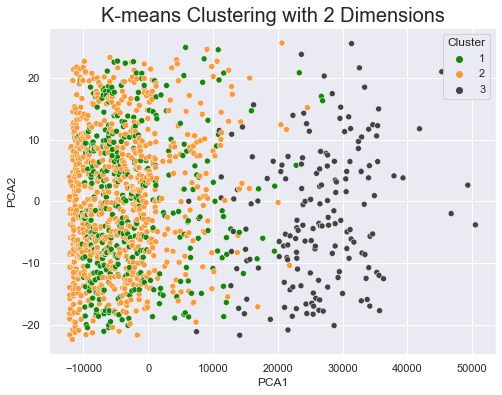

In [42]:
# Make a plot based on each cluster
sns.scatterplot(x = 'PCA1', y = 'PCA2', hue = insurance3_st['Cluster'], 
                palette = sns.blend_palette(['#138808','#ff9933','#434343'],3),
                data = insurance3_st)
plt.title('K-means Clustering with 2 Dimensions', fontsize = 20)
plt.show()

Text(0.5, 1.0, 'Correlation Between All Numerical Data')

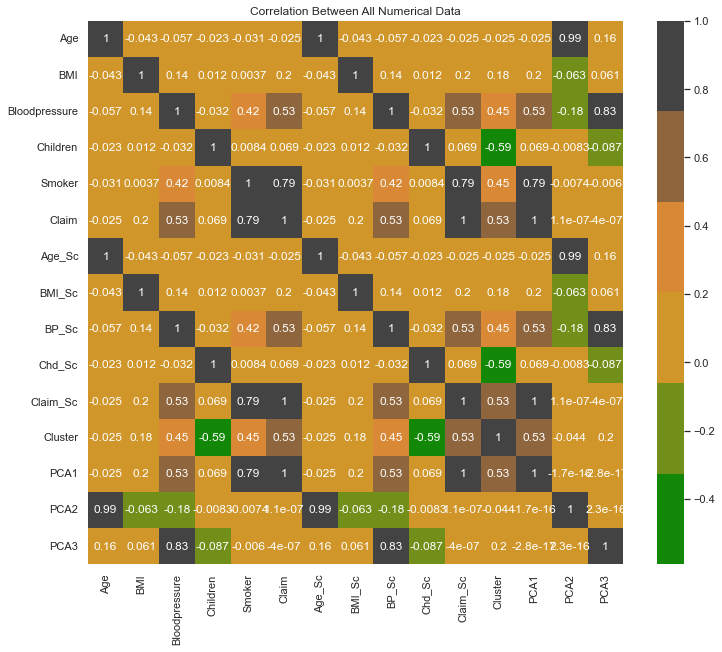

In [43]:
sns.set(rc={'figure.figsize':(12,10)})
sns.heatmap(insurance3_st.corr(), annot=True, 
            cmap = sns.blend_palette(['#138808','#ff9933','#434343'])).set_title('Correlation Between All Numerical Data')

In [44]:
# sns.pairplot(data = insurance3_st, hue = 'Cluster').fig.suptitle("Comparision For Each Cluster", y = 1);

In [45]:
fig3 = px.scatter_3d(insurance3_st, x = 'PCA1', y = 'PCA2',z = 'PCA3', color = 'Cluster', size = 'Claim',
                     opacity = 0.7,
                     color_continuous_scale = ['#138808','#ff9933','#434343'],
                     title = '6 Features Representation')
fig3.show()

---